# Loki Align - 8 normal small intestine samples
This notebook demonstrates how to run *Loki Align* on a dataset of 8 adjunction sections of normal small intestine samples. It takes about 3 mins to run the code to align (ST-to-ST and Image-to-ST) each sample (about 20 mins to finish all 7 source samples) on MacBook Pro .

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import os
from matplotlib.colors import rgb2hex

import loki.align
import loki.preprocess
import loki.utils
import loki.plot

/opt/anaconda3/envs/loki/lib/python3.9/site-packages/timm/models/layers/__init__.py:48: FutureWarning: Importing from timm.models.layers is deprecated, please import via timm.layers
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.layers", FutureWarning)


We first finetune OmiCLIP model on the target small intestin sample data.

In [2]:
%%script echo "Comment this line to fine-tune the model on the target small intestine data."

import subprocess
import open_clip

model_name='coca_ViT-L-14'
pretrained_weight_path='path to the omiclip pretrained weight'
train_csv = 'visium_data/finetune_data.csv'
name = 'finetune_si'

train_command = [
    'python', '-m', 'training.main',
    '--name', name,
    '--save-frequency', '5',
    '--zeroshot-frequency', '10',
    '--report-to', 'wandb',
    '--train-data', train_csv,
    '--csv-img-key', 'img_path',
    '--csv-caption-key', 'label',
    '--warmup', '10',
    '--batch-size', '64',
    '--lr', '5e-6',
    '--wd', '0.1',
    '--epochs', '10',
    '--workers', '16',
    '--model', model_name,
    '--csv-separator', ',',
    '--pretrained', pretrained_weight_path,
    '--lock-text-freeze-layer-norm',
    '--lock-image-freeze-bn-stats',
    '--coca-caption-loss-weight','0',
    '--coca-contrastive-loss-weight','1',
    '--val-frequency', '10',
    '--aug-cfg', 'color_jitter=(0.32, 0.32, 0.32, 0.08)', 'color_jitter_prob=0.5', 'gray_scale_prob=0'
]

subprocess.run(train_command)

Comment this line to fine-tune the model on the target small intestine data.


We provide the embeddings generated from the OmiCLIP model.
The sample data and embeddings are stored in the directory `data/loki_align/eight_small_intestine_samples`, which can be donwloaded from [Google Drive link](https://drive.google.com/file/d/1aPK1nItsOEPxTihUAKMig-vLY-DMMIce/view?usp=sharing).

Here is a list of the files that are needed to run the cell type decomposition on the pseudo Visium data:
```
    .                                                                                                                       
    ├── checkpoint_si                                                                                                 
    │   ├── V10F24-048_A1_img_features.csv                                                                                           
    │   ├── V10F24-048_A1_txt_features.csv                                                                               
    │   ├── V10F24-048_B1_img_features.csv                                                                                           
    │   ├── V10F24-048_B1_txt_features.csv                                                                                       
    │   ├── V10F24-048_C1_txt_features.csv     
    │   ├── V10F24-048_C1_img_features.csv                                                                                           
    │   ├── V10F24-048_D1_txt_features.csv                                                                                  
    │   ├── V10F24-048_D1_img_features.csv                                                                                           
    │   ├── V10F24-050_A1_txt_features_zs.csv                                                                                           
    │   ├── V10F24-050_A1_img_features.csv                                                                                           
    │   ├── V10F24-050_A1_txt_features.csv                                                                               
    │   ├── V10F24-050_B1_img_features.csv                                                                                           
    │   ├── V10F24-050_B1_txt_features.csv                                                                                       
    │   ├── V10F24-050_C1_txt_features.csv     
    │   ├── V10F24-050_C1_img_features.csv                                                                                           
    │   ├── V10F24-050_D1_txt_features.csv                                                                     
    │   └── V10F24-050_D1_img_features.csv                                                                                                             
    └── visium_data                                                                                                     
        ├── V10F24-048_A1.h5ad                                                                                              
        ├── V10F24-048_B1.h5ad     
        ├── V10F24-048_C1.h5ad
        ├── V10F24-048_D1.h5ad
        ├── V10F24-050_A1.h5ad
        ├── V10F24-050_B1.h5ad
        ├── V10F24-050_C1.h5ad                                                                                                 
        └── V10F24-050_D1.h5ad                                 
```

In [3]:
data_dir = './data/loki_align/eight_small_intestine_samples/'

In [4]:
def get_features(sample_name, feature_name):
    features_path=os.path.join(data_dir, 'checkpoint_si', sample_name+feature_name+'.csv')
    features = pd.read_csv(features_path, index_col=0, header = None)

    return features

In [5]:
tar_sample_name = 'V10F24-050_A1'
ad_path = os.path.join(data_dir, 'visium_data', tar_sample_name+'.h5ad')
ad_tar, ad_tar_coor, tar_img = loki.preprocess.prepare_data_for_alignment(ad_path)

Future exception was never retrieved
future: <Future finished exception=BrokenPipeError(32, 'Broken pipe')>
Traceback (most recent call last):
  File "/opt/anaconda3/envs/loki/lib/python3.9/asyncio/unix_events.py", line 665, in write
    n = os.write(self._fileno, data)
BrokenPipeError: [Errno 32] Broken pipe
/opt/anaconda3/envs/loki/lib/python3.9/site-packages/anndata/_core/anndata.py:1756: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


## Loki Align on ST and image alignment
Run tissue alignment using the ST data and image.

### Source1

In [6]:
src_sample_name = 'V10F24-050_B1'
ad_path = os.path.join(data_dir, 'visium_data', src_sample_name+'.h5ad')
ad_src, ad_src_coor, src_img =  loki.preprocess.prepare_data_for_alignment(ad_path)

/opt/anaconda3/envs/loki/lib/python3.9/site-packages/anndata/_core/anndata.py:1756: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


#### Loki Align on ST to ST alignment
Use Loki Align to align ST to ST.

In [7]:
tar_features = get_features(tar_sample_name, '_txt_features_zs')
src_features = get_features(src_sample_name, '_txt_features')

In [8]:
pca_comb_features, pca_comb_features_batch = loki.utils.get_pca_by_fit(tar_features, src_features)
pca_rgb_comb = (pca_comb_features-pca_comb_features.min(axis=0))/(pca_comb_features.max(axis=0)-pca_comb_features.min(axis=0))
pca_rgb_comb[:,[0,1,2]]=pca_rgb_comb[:,[0,2,1]]
pca_hex_comb = [ rgb2hex(pca_rgb_comb[i,:]) for i in range(pca_rgb_comb.shape[0]) ]

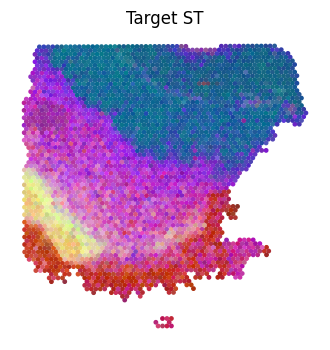

In [9]:
plt.figure(figsize=(4,4))
plt.scatter(ad_tar_coor[:,0], ad_tar_coor[:,1], marker='o', s=6, c=pca_hex_comb[:len(tar_features.T)])
plt.title('Target ST')
plt.axis('off')
plt.show()

In [10]:
cpd_coor, homo_coor, aligned_image = loki.align.align_tissue(ad_tar_coor, ad_src_coor, pca_comb_features, src_img)

In [11]:
len(pca_hex_comb)

6760

In [12]:
# loki.plot.plot_alignment_with_img(ad_tar_coor, ad_src_coor, homo_coor, tar_img, src_img, aligned_image, pca_hex_comb, tar_features)

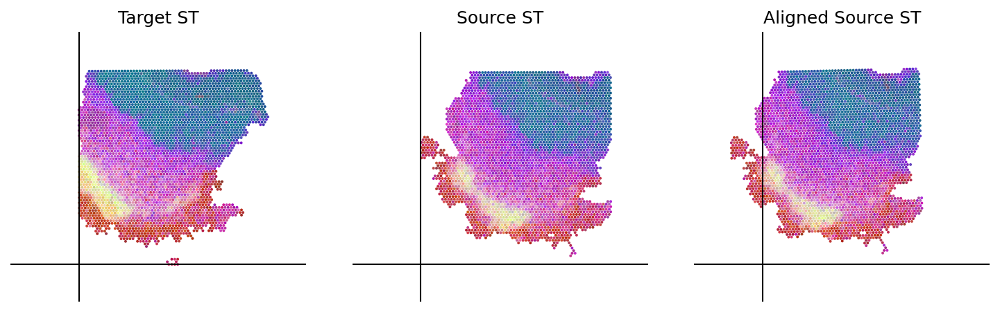

In [13]:
loki.plot.plot_alignment(ad_tar_coor, ad_src_coor, homo_coor, pca_hex_comb, tar_features)

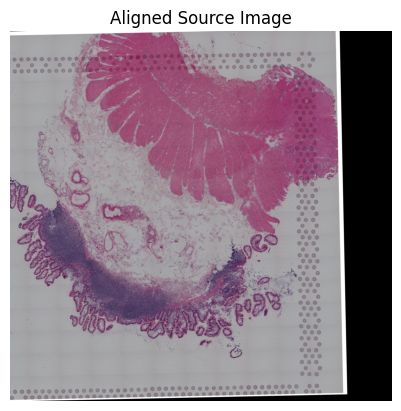

In [14]:
loki.plot.show_image(aligned_image)

#### Loki Align on image to ST Alignment
Use Loki Align to align image to ST.

In [15]:
tar_features = get_features(tar_sample_name, '_txt_features')
src_features = get_features(src_sample_name, '_img_features')

In [16]:
pca_comb_features, pca_comb_features_batch = loki.utils.get_pca_by_fit(tar_features, src_features)
cpd_coor, homo_coor, aligned_image = loki.align.align_tissue(ad_tar_coor, ad_src_coor, pca_comb_features, src_img)

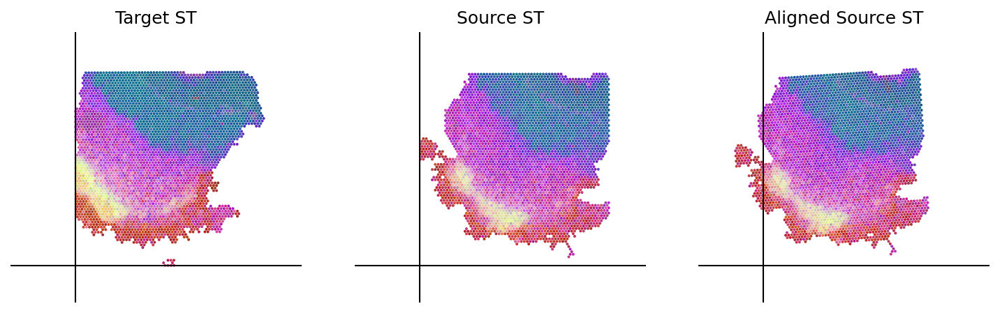

In [17]:
loki.plot.plot_alignment(ad_tar_coor, ad_src_coor, homo_coor, pca_hex_comb, tar_features)

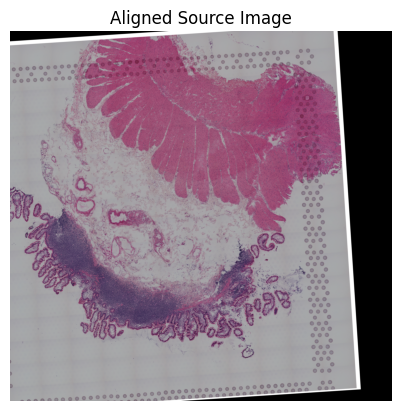

In [18]:
loki.plot.show_image(aligned_image)

### Source2

In [19]:
src_sample_name = 'V10F24-050_C1'
ad_path = os.path.join(data_dir, 'visium_data', src_sample_name+'.h5ad')
ad_src, ad_src_coor, src_img =  loki.preprocess.prepare_data_for_alignment(ad_path)

/opt/anaconda3/envs/loki/lib/python3.9/site-packages/anndata/_core/anndata.py:1756: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


#### Loki Align on ST to ST alignment
Use Loki Align to align ST to ST.

In [20]:
tar_features = get_features(tar_sample_name, '_txt_features_zs')
src_features = get_features(src_sample_name, '_txt_features')

In [21]:
pca_comb_features, pca_comb_features_batch = loki.utils.get_pca_by_fit(tar_features, src_features)
pca_rgb_comb = (pca_comb_features-pca_comb_features.min(axis=0))/(pca_comb_features.max(axis=0)-pca_comb_features.min(axis=0))
pca_rgb_comb[:,[0,1,2]]=pca_rgb_comb[:,[0,2,1]]
pca_hex_comb = [ rgb2hex(pca_rgb_comb[i,:]) for i in range(pca_rgb_comb.shape[0]) ]

In [22]:
cpd_coor, homo_coor, aligned_image = loki.align.align_tissue(ad_tar_coor, ad_src_coor, pca_comb_features, src_img)

In [23]:
# loki.plot.plot_alignment_with_img(ad_tar_coor, ad_src_coor, homo_coor, tar_img, src_img, aligned_image, pca_hex_comb, tar_features)

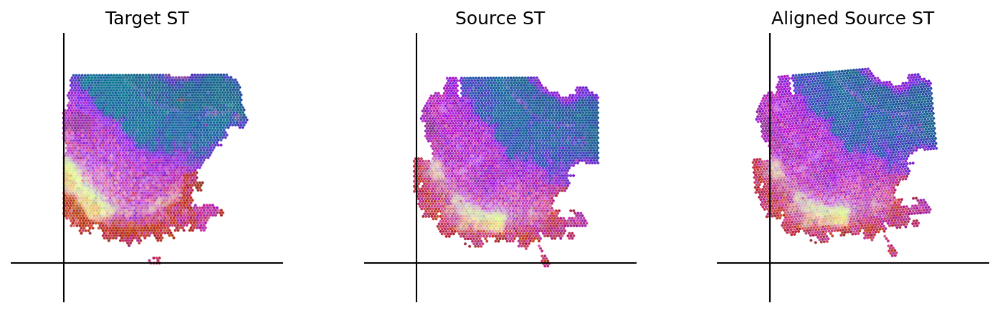

In [24]:
loki.plot.plot_alignment(ad_tar_coor, ad_src_coor, homo_coor, pca_hex_comb, tar_features)

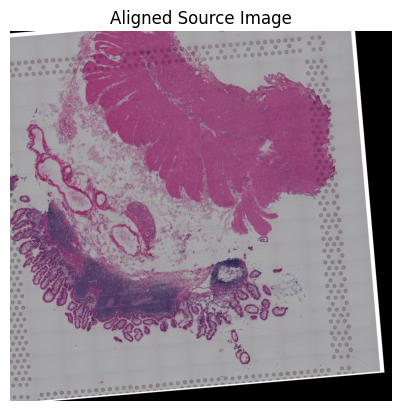

In [25]:
loki.plot.show_image(aligned_image)

#### Loki Align on image to ST Alignment
Use Loki Align to align image to ST.

In [26]:
tar_features = get_features(tar_sample_name, '_txt_features')
src_features = get_features(src_sample_name, '_img_features')

In [27]:
pca_comb_features, pca_comb_features_batch = loki.utils.get_pca_by_fit(tar_features, src_features)
cpd_coor, homo_coor, aligned_image = loki.align.align_tissue(ad_tar_coor, ad_src_coor, pca_comb_features, src_img)

In [28]:
# loki.plot.plot_alignment_with_img(ad_tar_coor, ad_src_coor, homo_coor, tar_img, src_img, aligned_image, pca_hex_comb, tar_features)

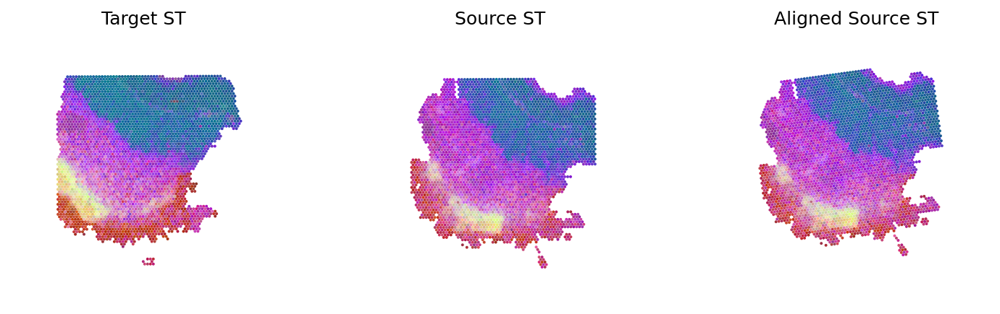

In [29]:
loki.plot.plot_alignment(ad_tar_coor, ad_src_coor, homo_coor, pca_hex_comb, tar_features, boundary_line=False)

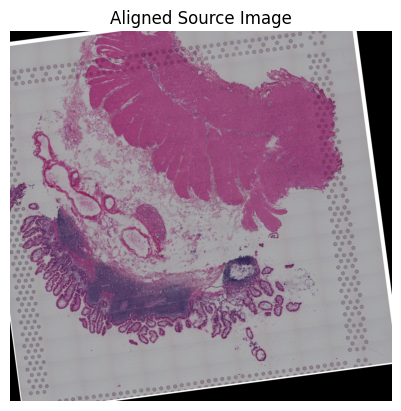

In [30]:
loki.plot.show_image(aligned_image)

### Source3

In [31]:
src_sample_name = 'V10F24-050_D1'
ad_path = os.path.join(data_dir, 'visium_data', src_sample_name+'.h5ad')
ad_src, ad_src_coor, src_img =  loki.preprocess.prepare_data_for_alignment(ad_path)

/opt/anaconda3/envs/loki/lib/python3.9/site-packages/anndata/_core/anndata.py:1756: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


#### Loki Align on ST to ST alignment
Use Loki Align to align ST to ST.

In [32]:
tar_features = get_features(tar_sample_name, '_txt_features_zs')
src_features = get_features(src_sample_name, '_txt_features')

In [33]:
pca_comb_features, pca_comb_features_batch = loki.utils.get_pca_by_fit(tar_features, src_features)
pca_rgb_comb = (pca_comb_features-pca_comb_features.min(axis=0))/(pca_comb_features.max(axis=0)-pca_comb_features.min(axis=0))
pca_rgb_comb[:,[0,1,2]]=pca_rgb_comb[:,[0,2,1]]
pca_hex_comb = [ rgb2hex(pca_rgb_comb[i,:]) for i in range(pca_rgb_comb.shape[0]) ]

In [34]:
cpd_coor, homo_coor, aligned_image = loki.align.align_tissue(ad_tar_coor, ad_src_coor, pca_comb_features, src_img)

In [35]:
# loki.plot.plot_alignment_with_img(ad_tar_coor, ad_src_coor, homo_coor, tar_img, src_img, aligned_image, pca_hex_comb, tar_features)

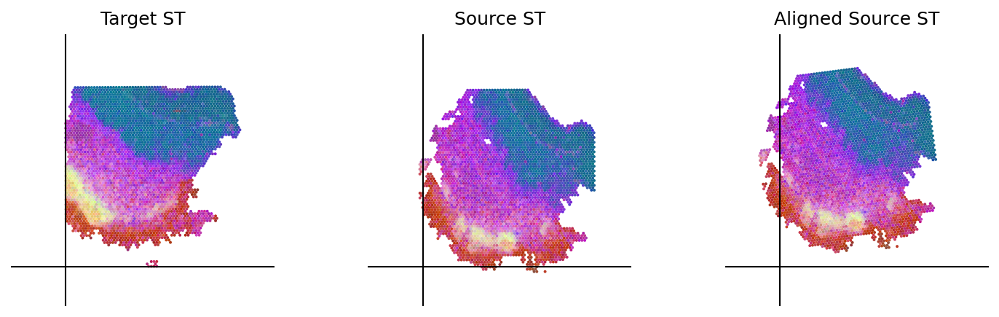

In [36]:
loki.plot.plot_alignment(ad_tar_coor, ad_src_coor, homo_coor, pca_hex_comb, tar_features)

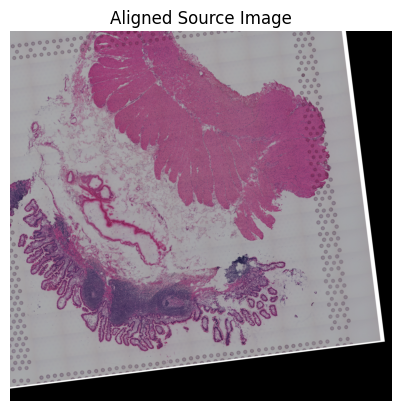

In [37]:
loki.plot.show_image(aligned_image)

#### Loki Align on image to ST Alignment
Use Loki Align to align image to ST.

In [38]:
tar_features = get_features(tar_sample_name, '_txt_features')
src_features = get_features(src_sample_name, '_img_features')

In [39]:
pca_comb_features, pca_comb_features_batch = loki.utils.get_pca_by_fit(tar_features, src_features)
cpd_coor, homo_coor, aligned_image = loki.align.align_tissue(ad_tar_coor, ad_src_coor, pca_comb_features, src_img)

In [40]:
# loki.plot.plot_alignment_with_img(ad_tar_coor, ad_src_coor, homo_coor, tar_img, src_img, aligned_image, pca_hex_comb, tar_features)

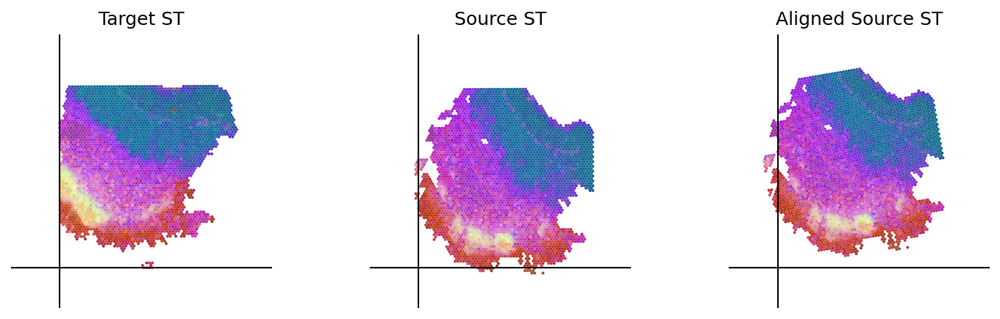

In [41]:
loki.plot.plot_alignment(ad_tar_coor, ad_src_coor, homo_coor, pca_hex_comb, tar_features)

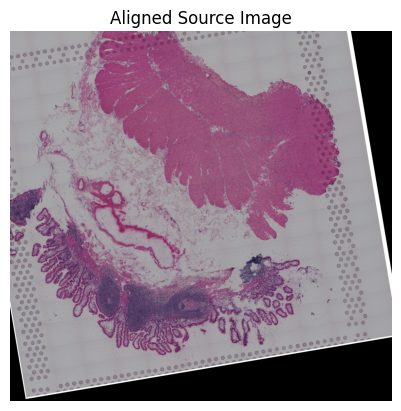

In [42]:
loki.plot.show_image(aligned_image)

### Source4

In [43]:
src_sample_name = 'V10F24-048_C1'
ad_path = os.path.join(data_dir, 'visium_data', src_sample_name+'.h5ad')
ad_src, ad_src_coor, src_img =  loki.preprocess.prepare_data_for_alignment(ad_path)

/opt/anaconda3/envs/loki/lib/python3.9/site-packages/anndata/_core/anndata.py:1756: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


#### Loki Align on ST to ST Alignment
Use Loki Align to align ST to ST.

In [44]:
tar_features = get_features(tar_sample_name, '_txt_features_zs')
src_features = get_features(src_sample_name, '_txt_features')

In [45]:
pca_comb_features, pca_comb_features_batch = loki.utils.get_pca_by_fit(tar_features, src_features)
pca_rgb_comb = (pca_comb_features-pca_comb_features.min(axis=0))/(pca_comb_features.max(axis=0)-pca_comb_features.min(axis=0))
pca_rgb_comb[:,[0,1,2]]=pca_rgb_comb[:,[0,2,1]]
pca_hex_comb = [ rgb2hex(pca_rgb_comb[i,:]) for i in range(pca_rgb_comb.shape[0]) ]

In [46]:
cpd_coor, homo_coor, aligned_image = loki.align.align_tissue(ad_tar_coor, ad_src_coor, pca_comb_features, src_img)

In [47]:
# loki.plot.plot_alignment_with_img(ad_tar_coor, ad_src_coor, homo_coor, tar_img, src_img, aligned_image, pca_hex_comb, tar_features)

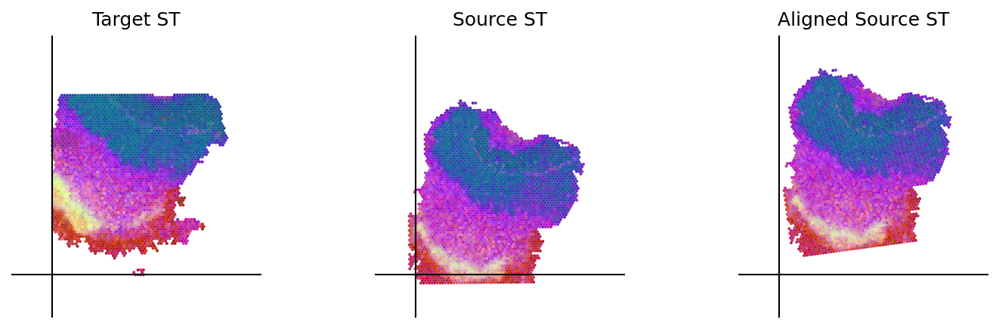

In [48]:
loki.plot.plot_alignment(ad_tar_coor, ad_src_coor, homo_coor, pca_hex_comb, tar_features)

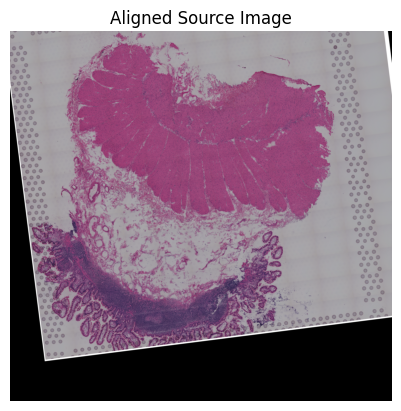

In [49]:
loki.plot.show_image(aligned_image)

#### Loki Align on image to ST Alignment
Use Loki Align to align image to ST.

In [50]:
tar_features = get_features(tar_sample_name, '_txt_features')
src_features = get_features(src_sample_name, '_img_features')

In [51]:
pca_comb_features, pca_comb_features_batch = loki.utils.get_pca_by_fit(tar_features, src_features)
cpd_coor, homo_coor, aligned_image = loki.align.align_tissue(ad_tar_coor, ad_src_coor, pca_comb_features, src_img)

In [52]:
# loki.plot.plot_alignment_with_img(ad_tar_coor, ad_src_coor, homo_coor, tar_img, src_img, aligned_image, pca_hex_comb, tar_features)

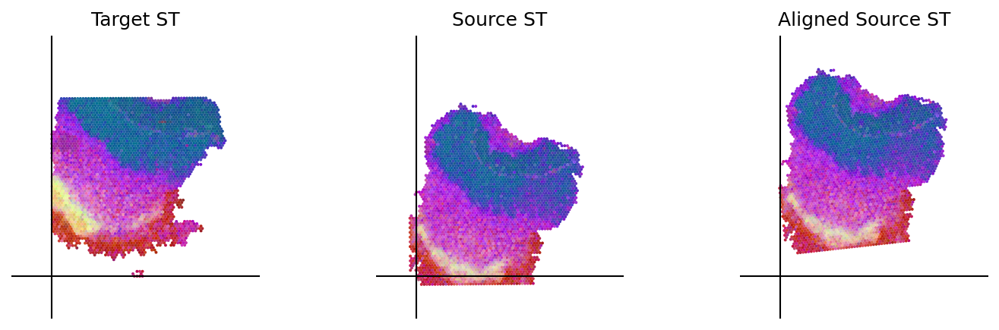

In [53]:
loki.plot.plot_alignment(ad_tar_coor, ad_src_coor, homo_coor, pca_hex_comb, tar_features)

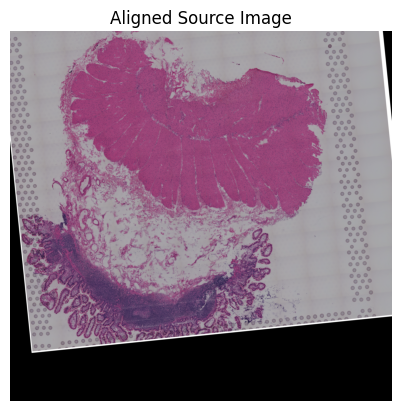

In [54]:
loki.plot.show_image(aligned_image)

### Source5

In [55]:
src_sample_name = 'V10F24-048_D1'
ad_path = os.path.join(data_dir, 'visium_data', src_sample_name+'.h5ad')
ad_src, ad_src_coor, src_img =  loki.preprocess.prepare_data_for_alignment(ad_path)

/opt/anaconda3/envs/loki/lib/python3.9/site-packages/anndata/_core/anndata.py:1756: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


#### Loki Align on ST to ST alignment
Use Loki Align to align ST to ST.

In [56]:
tar_features = get_features(tar_sample_name, '_txt_features_zs')
src_features = get_features(src_sample_name, '_txt_features')

In [57]:
pca_comb_features, pca_comb_features_batch = loki.utils.get_pca_by_fit(tar_features, src_features)
pca_rgb_comb = (pca_comb_features-pca_comb_features.min(axis=0))/(pca_comb_features.max(axis=0)-pca_comb_features.min(axis=0))
pca_rgb_comb[:,[0,1,2]]=pca_rgb_comb[:,[0,2,1]]
pca_hex_comb = [ rgb2hex(pca_rgb_comb[i,:]) for i in range(pca_rgb_comb.shape[0]) ]

In [58]:
cpd_coor, homo_coor, aligned_image = loki.align.align_tissue(ad_tar_coor, ad_src_coor, pca_comb_features, src_img)

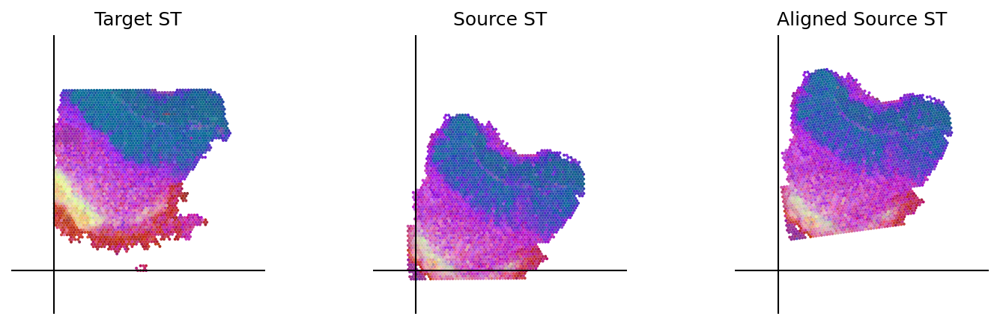

In [59]:
loki.plot.plot_alignment(ad_tar_coor, ad_src_coor, homo_coor, pca_hex_comb, tar_features)

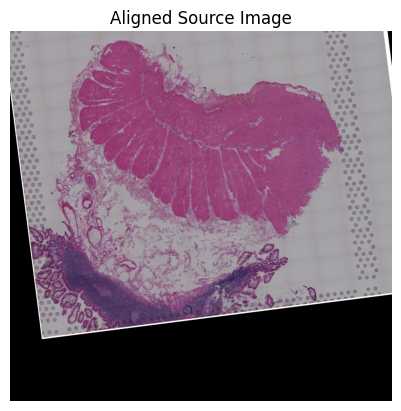

In [60]:
loki.plot.show_image(aligned_image)

#### Loki Align on image to ST Alignment
Use Loki Align to align image to ST.

In [61]:
tar_features = get_features(tar_sample_name, '_txt_features')
src_features = get_features(src_sample_name, '_img_features')

In [62]:
pca_comb_features, pca_comb_features_batch = loki.utils.get_pca_by_fit(tar_features, src_features)
cpd_coor, homo_coor, aligned_image = loki.align.align_tissue(ad_tar_coor, ad_src_coor, pca_comb_features, src_img)

In [63]:
# loki.plot.plot_alignment_with_img(ad_tar_coor, ad_src_coor, homo_coor, tar_img, src_img, aligned_image, pca_hex_comb, tar_features)

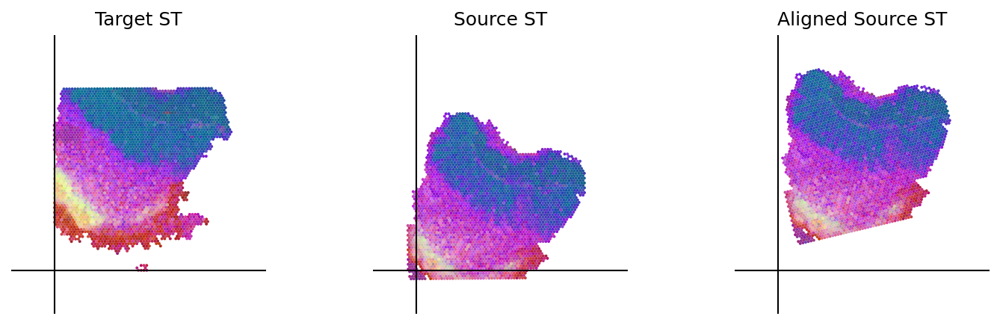

In [64]:
loki.plot.plot_alignment(ad_tar_coor, ad_src_coor, homo_coor, pca_hex_comb, tar_features)

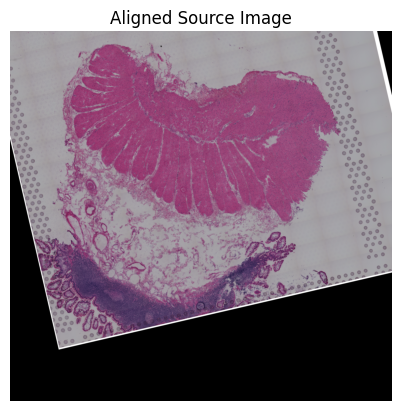

In [65]:
loki.plot.show_image(aligned_image)

### Source6

In [66]:
src_sample_name = 'V10F24-048_B1'
ad_path = os.path.join(data_dir, 'visium_data', src_sample_name+'.h5ad')
ad_src, ad_src_coor, src_img =  loki.preprocess.prepare_data_for_alignment(ad_path)

#### Loki Align on ST to ST alignment
Use Loki Align to align ST to ST.

In [67]:
tar_features = get_features(tar_sample_name, '_txt_features_zs')
src_features = get_features(src_sample_name, '_txt_features')

In [68]:
pca_comb_features, pca_comb_features_batch = loki.utils.get_pca_by_fit(tar_features, src_features)
pca_rgb_comb = (pca_comb_features-pca_comb_features.min(axis=0))/(pca_comb_features.max(axis=0)-pca_comb_features.min(axis=0))
pca_rgb_comb[:,[0,1,2]]=pca_rgb_comb[:,[0,2,1]]
pca_hex_comb = [ rgb2hex(pca_rgb_comb[i,:]) for i in range(pca_rgb_comb.shape[0]) ]

In [69]:
cpd_coor, homo_coor, aligned_image = loki.align.align_tissue(ad_tar_coor, ad_src_coor, pca_comb_features, src_img)

In [70]:
# loki.plot.plot_alignment_with_img(ad_tar_coor, ad_src_coor, homo_coor, tar_img, src_img, aligned_image, pca_hex_comb, tar_features)

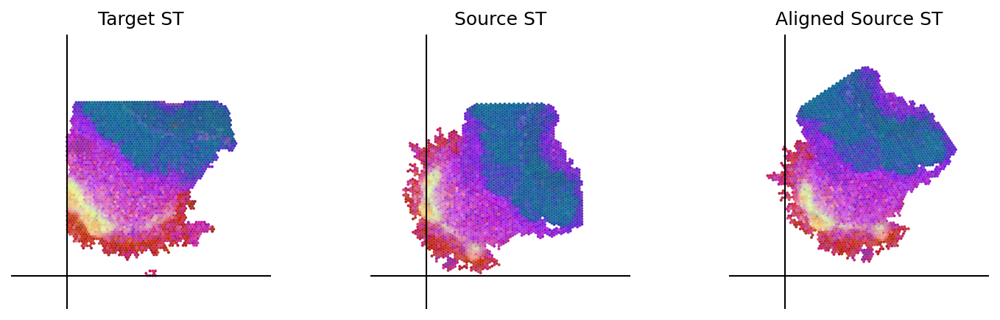

In [71]:
loki.plot.plot_alignment(ad_tar_coor, ad_src_coor, homo_coor, pca_hex_comb, tar_features)

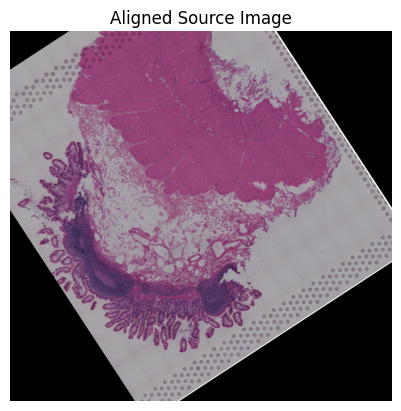

In [72]:
loki.plot.show_image(aligned_image)

#### Loki Align on image to ST Alignment
Use Loki Align to align image to ST.

In [73]:
tar_features = get_features(tar_sample_name, '_txt_features_zs')
src_features = get_features(src_sample_name, '_txt_features')

In [74]:
pca_comb_features, pca_comb_features_batch = loki.utils.get_pca_by_fit(tar_features, src_features)
cpd_coor, homo_coor, aligned_image = loki.align.align_tissue(ad_tar_coor, ad_src_coor, pca_comb_features, src_img)

In [75]:
# loki.plot.plot_alignment_with_img(ad_tar_coor, ad_src_coor, homo_coor, tar_img, src_img, aligned_image, pca_hex_comb, tar_features)

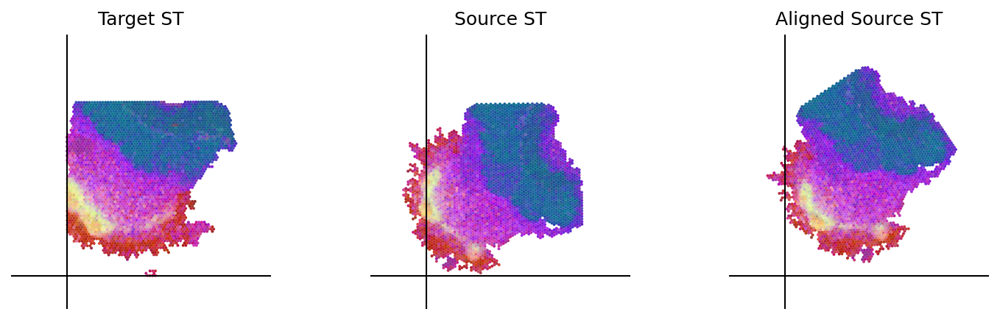

In [76]:
loki.plot.plot_alignment(ad_tar_coor, ad_src_coor, homo_coor, pca_hex_comb, tar_features)

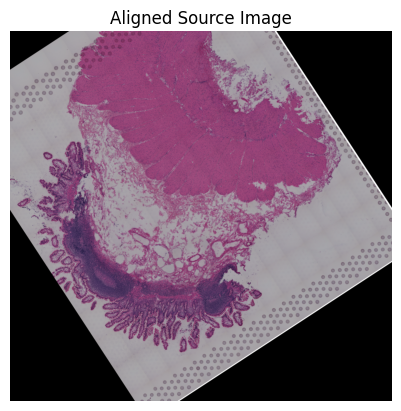

In [77]:
loki.plot.show_image(aligned_image)

### Source7

In [78]:
src_sample_name = 'V10F24-048_A1'
ad_path = os.path.join(data_dir, 'visium_data', src_sample_name+'.h5ad')
ad_src, ad_src_coor, src_img =  loki.preprocess.prepare_data_for_alignment(ad_path)

#### Loki Align on ST to ST alignment
Use Loki Align to align ST to ST.

In [79]:
tar_features = get_features(tar_sample_name, '_txt_features_zs')
src_features = get_features(src_sample_name, '_txt_features')

In [80]:
pca_comb_features, pca_comb_features_batch = loki.utils.get_pca_by_fit(tar_features, src_features)
pca_rgb_comb = (pca_comb_features-pca_comb_features.min(axis=0))/(pca_comb_features.max(axis=0)-pca_comb_features.min(axis=0))
pca_rgb_comb[:,[0,1,2]]=pca_rgb_comb[:,[0,2,1]]
pca_hex_comb = [ rgb2hex(pca_rgb_comb[i,:]) for i in range(pca_rgb_comb.shape[0]) ]

In [81]:
cpd_coor, homo_coor, aligned_image = loki.align.align_tissue(ad_tar_coor, ad_src_coor, pca_comb_features, src_img)

In [82]:
# loki.plot.plot_alignment_with_img(ad_tar_coor, ad_src_coor, homo_coor, tar_img, src_img, aligned_image, pca_hex_comb, tar_features)

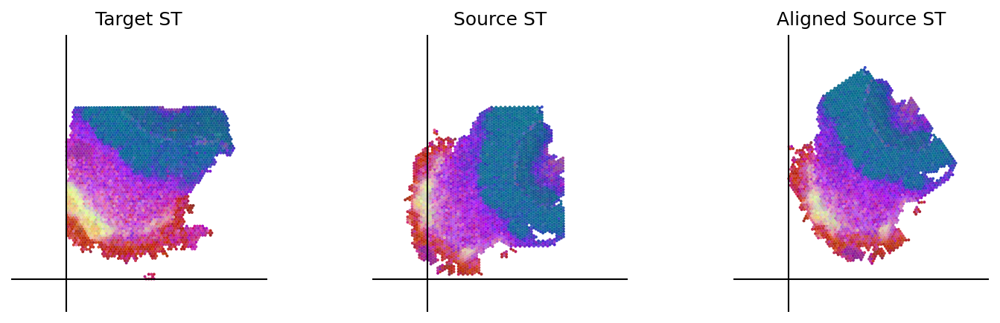

In [83]:
loki.plot.plot_alignment(ad_tar_coor, ad_src_coor, homo_coor, pca_hex_comb, tar_features)

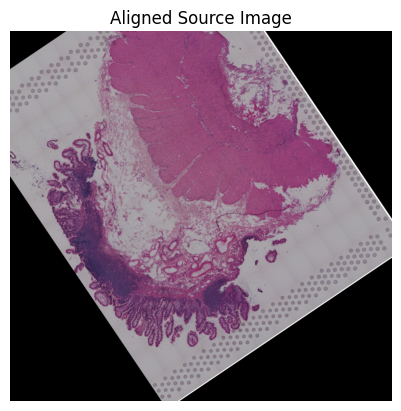

In [84]:
loki.plot.show_image(aligned_image)

#### Loki Align on image to ST Alignment
Use Loki Align to align image to ST.

In [85]:
tar_features = get_features(tar_sample_name, '_txt_features_zs')
src_features = get_features(src_sample_name, '_txt_features')

In [86]:
pca_comb_features, pca_comb_features_batch = loki.utils.get_pca_by_fit(tar_features, src_features)
cpd_coor, homo_coor, aligned_image = loki.align.align_tissue(ad_tar_coor, ad_src_coor, pca_comb_features, src_img)

In [87]:
# loki.plot.plot_alignment_with_img(ad_tar_coor, ad_src_coor, homo_coor, tar_img, src_img, aligned_image, pca_hex_comb, tar_features)

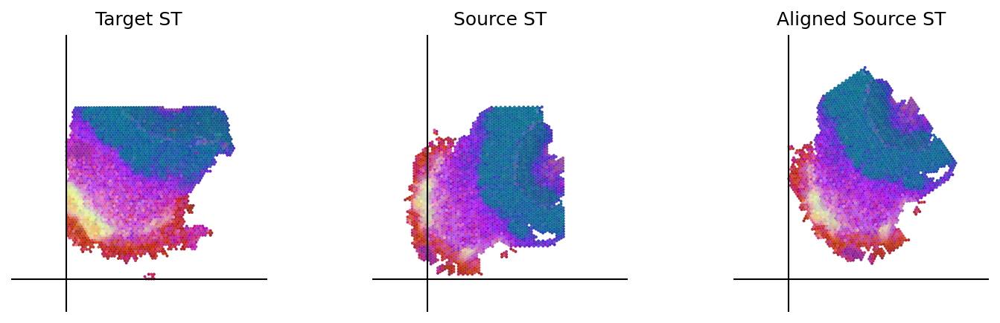

In [88]:
loki.plot.plot_alignment(ad_tar_coor, ad_src_coor, homo_coor, pca_hex_comb, tar_features)

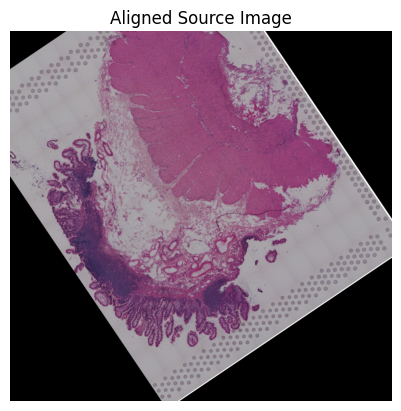

In [89]:
loki.plot.show_image(aligned_image)